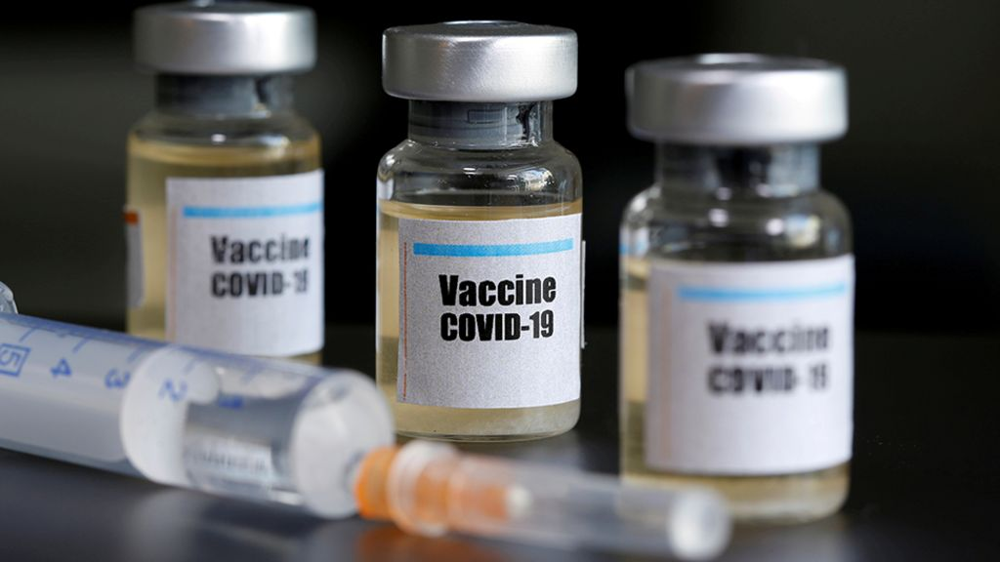

## The Pandemic that should never be forgotten!!

1. INTRODUCTION

The COVID-19 pandemic, the first modern pandemic, will define this era and no one who lives through this will ever forget it. It is impossible to overstate the pain that people are feeling now and will continue to feel for years to come, he said, adding that the disease is disproportionately hurting poorer communities and racial minorities.

Likewise, the economic impact of the shutdown is hitting low-income, minority workers the hardest.Policymakers and bureaucrats will need to make sure that, as the country opens up, the recovery doesn't make inequality even worse than it already is.

Countries are beginning to deploy COVID-19 vaccines, bringing new hope to the fight against the global pandemic. WHO, UNICEF, Gavi and many other partners are working together to support countries in preparing for COVID-19 vaccine introduction. With careful planning, countries can ensure infrastructure is in place and the technical support available to safely deliver COVID-19 vaccines.

In [147]:
# Loading the necessary packages 
packages <- c('dplyr','ggplot2','tidyverse','countrycode','plotly','tidyr','choroplethr','choroplethrMaps','lubridate','choroplethr','readr','skimr','naniar','ggmap','RColorBrewer','rworldmap','reshape2')

install_package <- packages %in% row.names(installed.packages())
if (any (install_package ==  FALSE))
  install.packages(packages[!install_package])

sapply(packages, require, character.only = TRUE)

dplyr         ggplot2       tidyverse     countrycode          plotly 
           TRUE            TRUE            TRUE            TRUE            TRUE 
          tidyr     choroplethr choroplethrMaps       lubridate     choroplethr 
           TRUE            TRUE            TRUE            TRUE            TRUE 
          readr           skimr          naniar           ggmap    RColorBrewer 
           TRUE            TRUE            TRUE            TRUE            TRUE 
      rworldmap        reshape2 
           TRUE            TRUE

In [203]:
# Loading the data set 
vaccine_data <- read.csv("/kaggle/input/covid-world-vaccination-progress/country_vaccinations.csv")

In [204]:
#View the data
head (vaccine_data)

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>
1,Afghanistan,AFG,2021-02-22,0,0,NA,NA,NA,0,0,NA,NA,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2021-03/16/c_139814668.htm
2,Afghanistan,AFG,2021-02-23,NA,NA,NA,NA,1367,NA,NA,NA,35,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2021-03/16/c_139814668.htm
3,Afghanistan,AFG,2021-02-24,NA,NA,NA,NA,1367,NA,NA,NA,35,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2021-03/16/c_139814668.htm
4,Afghanistan,AFG,2021-02-25,NA,NA,NA,NA,1367,NA,NA,NA,35,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2021-03/16/c_139814668.htm
5,Afghanistan,AFG,2021-02-26,NA,NA,NA,NA,1367,NA,NA,NA,35,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2021-03/16/c_139814668.htm
6,Afghanistan,AFG,2021-02-27,NA,NA,NA,NA,1367,NA,NA,NA,35,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2021-03/16/c_139814668.htm


In [206]:
#Inspect the structure of data
str(vaccine_data)


'data.frame':	9073 obs. of  15 variables:
 $ country                            : Factor w/ 161 levels "Afghanistan",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ iso_code                           : Factor w/ 161 levels "AFG","AGO","AIA",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ date                               : Factor w/ 108 levels "2020-12-13","2020-12-14",..: 72 73 74 75 76 77 78 79 80 81 ...
 $ total_vaccinations                 : num  0 NA NA NA NA NA 8200 NA NA NA ...
 $ people_vaccinated                  : num  0 NA NA NA NA NA 8200 NA NA NA ...
 $ people_fully_vaccinated            : num  NA NA NA NA NA NA NA NA NA NA ...
 $ daily_vaccinations_raw             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ daily_vaccinations                 : num  NA 1367 1367 1367 1367 ...
 $ total_vaccinations_per_hundred     : num  0 NA NA NA NA NA 0.02 NA NA NA ...
 $ people_vaccinated_per_hundred      : num  0 NA NA NA NA NA 0.02 NA NA NA ...
 $ people_fully_vaccinated_per_hundred: num  NA NA NA NA NA NA NA NA NA N

In [207]:
#Inspet the dimensions of the data
dim (vaccine_data)

[1] 9073   15

In [150]:
# Drop unneccesary features source_name and source_website
vaccine_data_copy <- vaccine_data[,1:13]
colnames(vaccine_data_copy)

[1] "country"                             "iso_code"                           
 [3] "date"                                "total_vaccinations"                 
 [5] "people_vaccinated"                   "people_fully_vaccinated"            
 [7] "daily_vaccinations_raw"              "daily_vaccinations"                 
 [9] "total_vaccinations_per_hundred"      "people_vaccinated_per_hundred"      
[11] "people_fully_vaccinated_per_hundred" "daily_vaccinations_per_million"     
[13] "vaccines"

In [151]:
# Total NA in the entire data set

paste("Total NA count:: ",sum(is.na(vaccine_data_copy)))

[1] "Total NA count::  31671"

In [152]:
# % of NA's in entire dataset
((sum(is.na(vaccine_data_copy)) / prod(dim(vaccine_data_copy))) * 100) %>%
round (2)

[1] 26.85

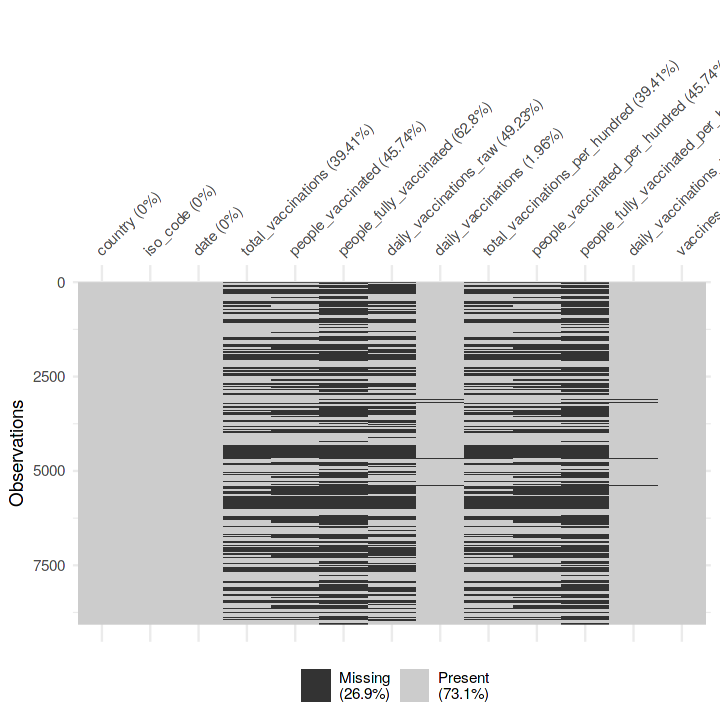

In [153]:
# NA's per feature can also be visualised as below

vis_miss(vaccine_data_copy)


In [154]:
    #total number of NA per feature

    data.frame("Total_NA" = colSums(is.na(vaccine_data_copy))) %>%
    mutate ("Percentage_of_NA" = (colSums(is.na(vaccine_data_copy))/dim(vaccine_data_copy)[1]) %>% 
            round (3) * 100)

,Total_NA,Percentage_of_NA
,<dbl>,<dbl>
country,0,0.0
iso_code,0,0.0
date,0,0.0
total_vaccinations,3576,39.4
people_vaccinated,4150,45.7
people_fully_vaccinated,5698,62.8
daily_vaccinations_raw,4467,49.2
daily_vaccinations,178,2.0
total_vaccinations_per_hundred,3576,39.4


In [155]:
# Countries for which the data is collected

unique(vaccine_data_copy$country)

[1] Afghanistan                      Albania                         
  [3] Algeria                          Andorra                         
  [5] Angola                           Anguilla                        
  [7] Antigua and Barbuda              Argentina                       
  [9] Australia                        Austria                         
 [11] Azerbaijan                       Bahamas                         
 [13] Bahrain                          Bangladesh                      
 [15] Barbados                         Belarus                         
 [17] Belgium                          Belize                          
 [19] Bermuda                          Bhutan                          
 [21] Bolivia                          Brazil                          
 [23] Bulgaria                         Cambodia                        
 [25] Canada                           Cape Verde                      
 [27] Cayman Islands                   Chile                           
 [29] China                            Colombia                        
 [31] Costa Rica                       Cote d'Ivoire                   
 [33] Croatia                          Cyprus                          
 [35] Czechia                          Denmark                         
 [37] Dominica                         Dominican Republic              
 [39] Ecuador                          Egypt                           
 [41] El Salvador                      England                         
 [43] Equatorial Guinea                Estonia                         
 [45] Faeroe Islands                   Falkland Islands                
 [47] Finland                          France                          
 [49] Gambia                           Georgia                         
 [51] Germany                          Ghana                           
 [53] Gibraltar                        Greece                          
 [55] Greenland                        Grenada                         
 [57] Guatemala                        Guernsey                        
 [59] Guinea                           Guyana                          
 [61] Honduras                         Hong Kong                       
 [63] Hungary                          Iceland                         
 [65] India                            Indonesia                       
 [67] Iran                             Iraq                            
 [69] Ireland                          Isle of Man                     
 [71] Israel                           Italy                           
 [73] Jamaica                          Japan                           
 [75] Jersey                           Jordan                          
 [77] Kazakhstan                       Kenya                           
 [79] Kuwait                           Laos                            
 [81] Latvia                           Lebanon                         
 [83] Liechtenstein                    Lithuania                       
 [85] Luxembourg                       Macao                           
 [87] Malawi                           Malaysia                        
 [89] Maldives                         Malta                           
 [91] Mauritius                        Mexico                          
 [93] Moldova                          Monaco                          
 [95] Mongolia                         Montenegro                      
 [97] Montserrat                       Morocco                         
 [99] Mozambique                       Myanmar                         
[101] Namibia                          Nepal                           
[103] Netherlands                      New Zealand                     
[105] Nigeria                          North Macedonia                 
[107] Northern Cyprus                  Northern Ireland                
[109] Norway                           Oman                            
[111] Pakistan                         Pal

In [156]:
# There is United kingdom and also its sovient countries included in the data, 
# let us verify if they have same number of records included

vaccine_data_copy %>%
filter (country %in% c('United Kingdom','Northern Ireland','England','Wales','Scotland'))%>%
group_by(country)%>%
count()

country,n
<fct>,<int>
England,107
Northern Ireland,107
Scotland,107
United Kingdom,107
Wales,107


In [157]:
#Data Cleaning
#There are few steps in this section:

#As shown by .head() method, our data obviously contains missing values, so we'll need to deal with it somehow
#Some of the country names appeared in the dataset, does not represent a single country (constituent countries) and also the union territories
#Multiple vaccines are updated in a single row and needs to be separated

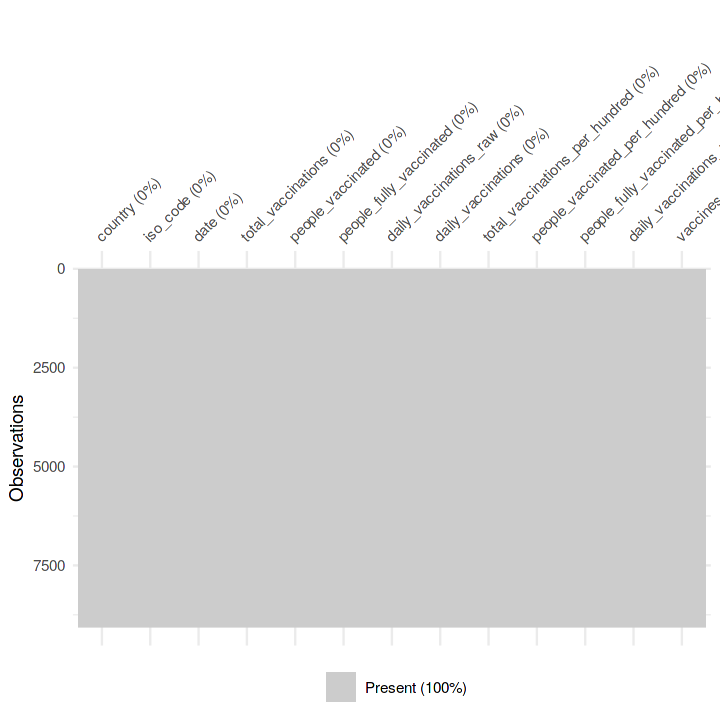

In [158]:
# Handling the missing values

vaccine_data_copy[is.na(vaccine_data_copy)] = 0

vis_miss(vaccine_data_copy)

# there are no more NA in the data set

In [159]:
# Removing the UK soviet countries
# I also consider to eliminate Gibraltar, Isle of Man, Cayman Islands, Falkland Islands, Guernsey, 
# Saint Helena, Turks and Caicos Islands (UK pertinence), Faeroe Islands (Denmark pertinence).
remove_countries = c('England','Northern Ireland','Scotland','Wales','Falkland Islands','Faeroe Islands','Isle of Man','Cayman Islands','Saint Helena','Saint Lucia','Saint Vincent and the Grenadines','Saint Kitts and Nevis')

vaccine_data_copy <- vaccine_data_copy %>%
  filter (!country %in% remove_countries) 

unique(vaccine_data_copy$country)

[1] Afghanistan              Albania                  Algeria                 
  [4] Andorra                  Angola                   Anguilla                
  [7] Antigua and Barbuda      Argentina                Australia               
 [10] Austria                  Azerbaijan               Bahamas                 
 [13] Bahrain                  Bangladesh               Barbados                
 [16] Belarus                  Belgium                  Belize                  
 [19] Bermuda                  Bhutan                   Bolivia                 
 [22] Brazil                   Bulgaria                 Cambodia                
 [25] Canada                   Cape Verde               Chile                   
 [28] China                    Colombia                 Costa Rica              
 [31] Cote d'Ivoire            Croatia                  Cyprus                  
 [34] Czechia                  Denmark                  Dominica                
 [37] Dominican Republic       Ecuador                  Egypt                   
 [40] El Salvador              Equatorial Guinea        Estonia                 
 [43] Finland                  France                   Gambia                  
 [46] Georgia                  Germany                  Ghana                   
 [49] Gibraltar                Greece                   Greenland               
 [52] Grenada                  Guatemala                Guernsey                
 [55] Guinea                   Guyana                   Honduras                
 [58] Hong Kong                Hungary                  Iceland                 
 [61] India                    Indonesia                Iran                    
 [64] Iraq                     Ireland                  Israel                  
 [67] Italy                    Jamaica                  Japan                   
 [70] Jersey                   Jordan                   Kazakhstan              
 [73] Kenya                    Kuwait                   Laos                    
 [76] Latvia                   Lebanon                  Liechtenstein           
 [79] Lithuania                Luxembourg               Macao                   
 [82] Malawi                   Malaysia                 Maldives                
 [85] Malta                    Mauritius                Mexico                  
 [88] Moldova                  Monaco                   Mongolia                
 [91] Montenegro               Montserrat               Morocco                 
 [94] Mozambique               Myanmar                  Namibia                 
 [97] Nepal                    Netherlands              New Zealand             
[100] Nigeria                  North Macedonia          Northern Cyprus         
[103] Norway                   Oman                     Pakistan                
[106] Palestine                Panama                   Paraguay                
[109] Peru                     Philippines              Poland                  
[112] Portugal                 Qatar                    Romania                 
[115] Russia                   Rwanda                   San Marino              
[118] Sao Tome and Principe    Saudi Arabia             Senegal                 
[121] Serbia                   Seychelles               Sierra Leone            
[124] Singapore                Slovakia                 Slovenia                
[127] South Africa             South Korea              Spain                   
[130] Sri Lanka                Suriname                 Sweden                  
[133] Switzerland              Taiwan                   Thailand                
[136] Togo                     Trinidad and Tobago      Tunisia                 
[139] Turkey                   Turks and Caicos Islands Uganda                  
[142] Ukraine                  United Arab Emirates     United Kingdom          
[145] United States            Uruguay                  Venezuela               
[148] Vietnam                  Zi

In [160]:
    # Below the Vaccines use world wide
    vaccine_data_copy$vaccines <- str_replace_all(vaccine_data_copy$vaccines, " ","")
    # remove all spaces in between
    vaccine_val<- unique(vaccine_data_copy$vaccines)
    vaccine<- vector()

    for (i in vaccine_val){
        for (j in strsplit(i, ",")){
            vaccine<- c(vaccine, j)
        }
    }
    vaccine_used<- unique(vaccine)
    vaccine_used

[1] "Oxford/AstraZeneca" "Pfizer/BioNTech"    "SputnikV"          
 [4] "Sinopharm/Beijing"  "Moderna"            "Sinovac"           
 [7] "Sinopharm/Wuhan"    "Covaxin"            "EpiVacCorona"      
[10] "Johnson&Johnson"

In [161]:
# Inspect the usage of vaccine used wordwide

vaccine_data_val <- data.frame(matrix(ncol = length(vaccine_used), nrow = 0))
for (i in vaccine_data_copy$vaccines){
  vaccine_data_val<- rbind(vaccine_data_val, Vectorize(grepl, USE.NAMES = TRUE)(vaccine_used, str_replace_all(i," ","")))
}
vaccine_data_val[vaccine_data_val == TRUE] = 1
vaccine_data_val[vaccine_data_val == FALSE] =0
colnames(vaccine_data_val) <- paste0(unique(vaccine))

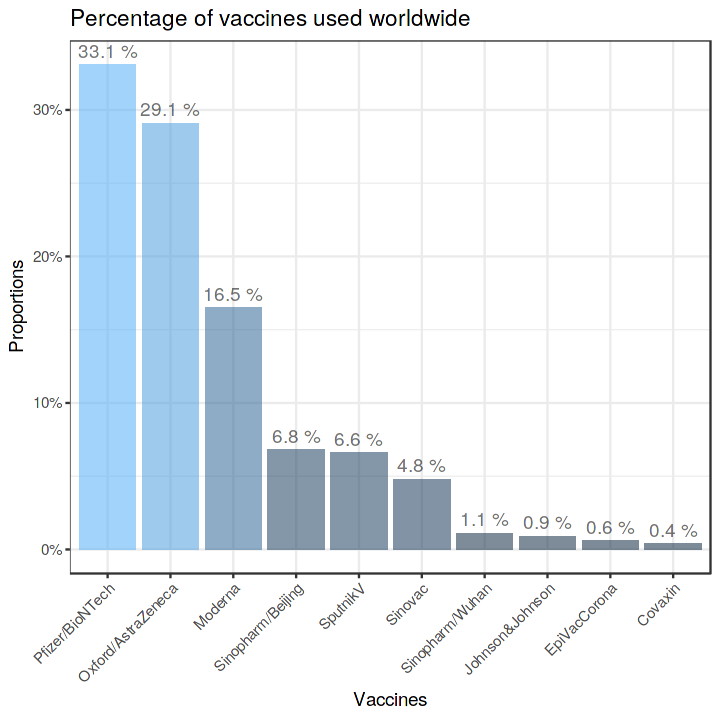

In [162]:
vaccine_data_val %>%
summarise_all(sum)%>%
gather(key="Vaccine_name", value = "Vaccine_count")%>%
mutate (Vaccine_count1 = round(Vaccine_count/sum(Vaccine_count),3))%>%
ggplot(mapping=aes(x=reorder(Vaccine_name,-Vaccine_count1), y=Vaccine_count1, fill =Vaccine_count1, alpha=0.7))+
geom_col()+
labs(x = "Vaccines", y = "Proportions", title  = "Percentage of vaccines used worldwide")+
geom_text(aes(label = paste(Vaccine_count1*100,"%")), vjust=-0.5)+
scale_y_continuous(labels = scales::percent) + 
theme_bw()+
theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "None")

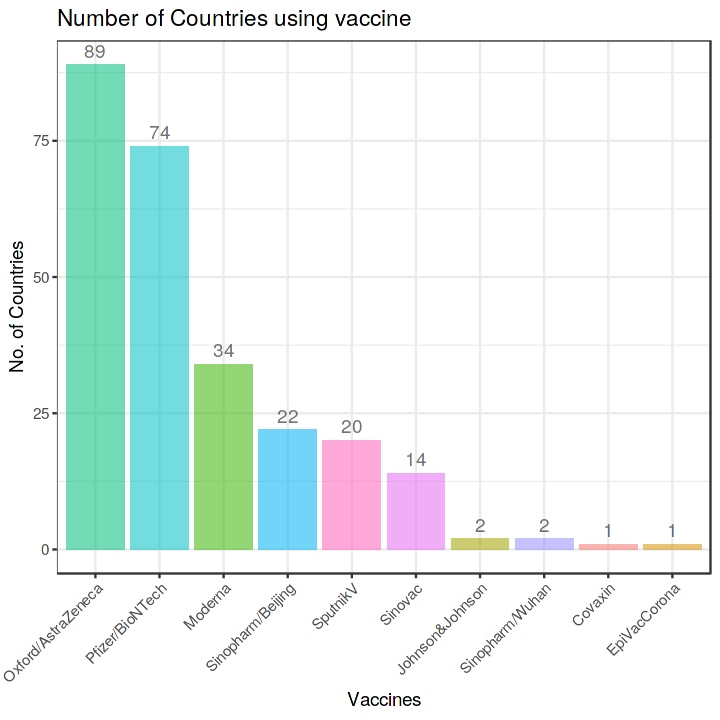

In [163]:
# No of countries using these vaccines



vaccine_in_countries<- vaccine_data_val %>%
mutate(country = vaccine_data_copy$country)%>%
group_by(country)%>%
summarise_all(sum)

data <- data.frame("No_of_countries"= apply(vaccine_in_countries[-1],2, function(c)sum(c!=0)))
cbind("Vaccine"=row.names(data),data) %>%
ggplot(mapping=aes(x=reorder(Vaccine, -No_of_countries), y=No_of_countries, fill = Vaccine, alpha=0.5))+
geom_col() +
labs(x = "Vaccines", y = "No. of Countries", title  = "Number of Countries using vaccine")+
geom_text(aes(label = No_of_countries), vjust=-0.5)+
theme_bw()+
theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "None")

In [164]:
#Spread of Vaccine accrosss the world

world_data<- vaccine_data_copy[,c(1,2,length(vaccine_data_copy))] %>%
distinct()%>%
separate_rows(vaccines, sep=",")


88 codes from your data successfully matched countries in the map
1 codes from your data failed to match with a country code in the map
155 codes from the map weren't represented in your data
72 codes from your data successfully matched countries in the map
2 codes from your data failed to match with a country code in the map
171 codes from the map weren't represented in your data


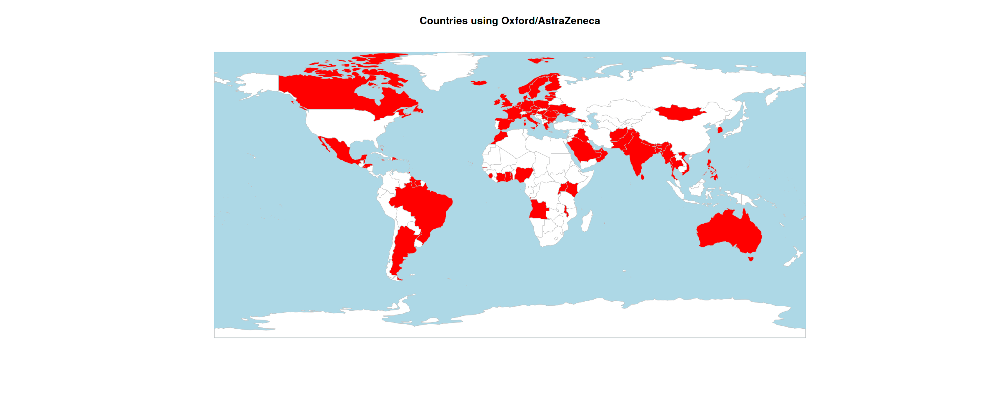

20 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
223 codes from the map weren't represented in your data


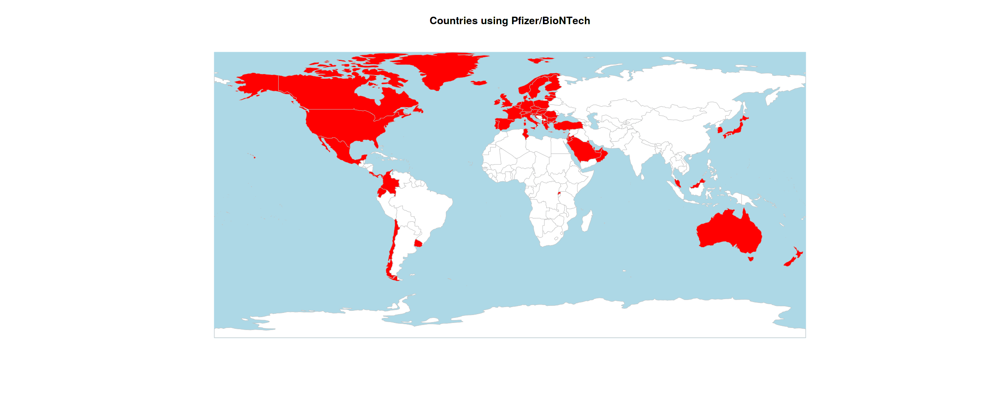

22 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
221 codes from the map weren't represented in your data


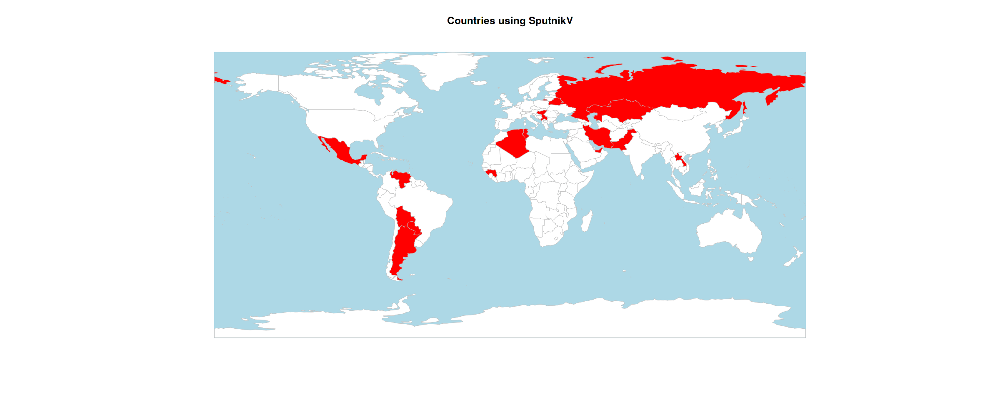

34 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
209 codes from the map weren't represented in your data


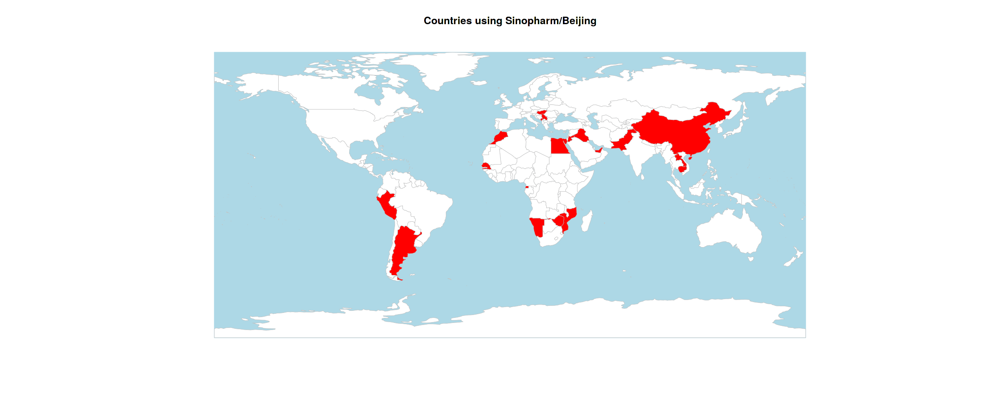

13 codes from your data successfully matched countries in the map
1 codes from your data failed to match with a country code in the map
230 codes from the map weren't represented in your data


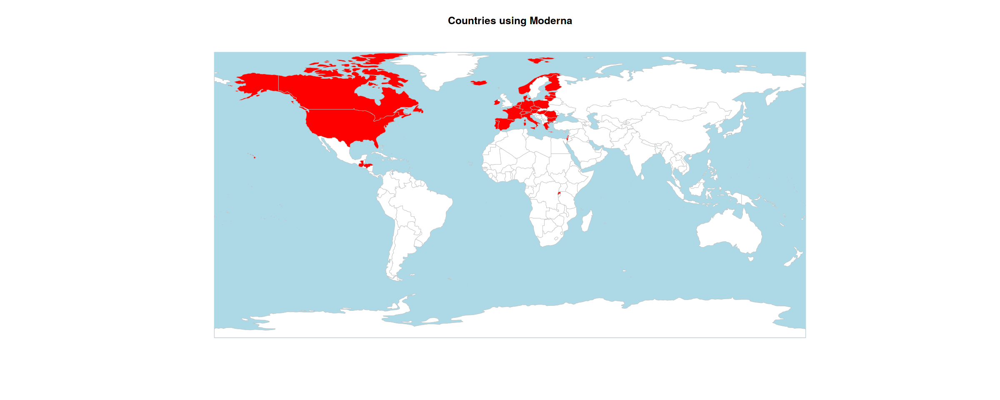

2 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
241 codes from the map weren't represented in your data


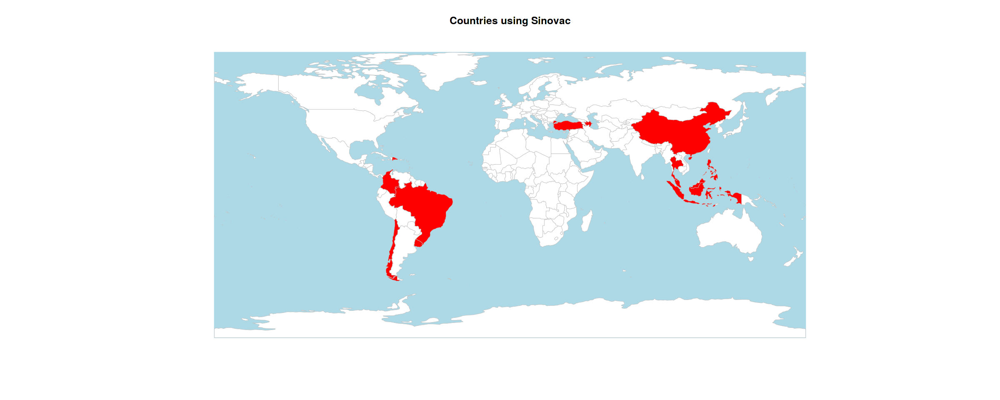

1 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
242 codes from the map weren't represented in your data


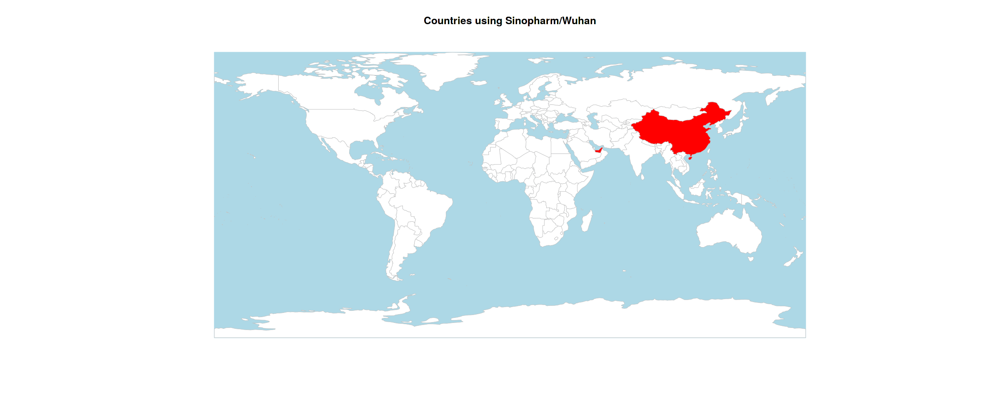

1 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
242 codes from the map weren't represented in your data


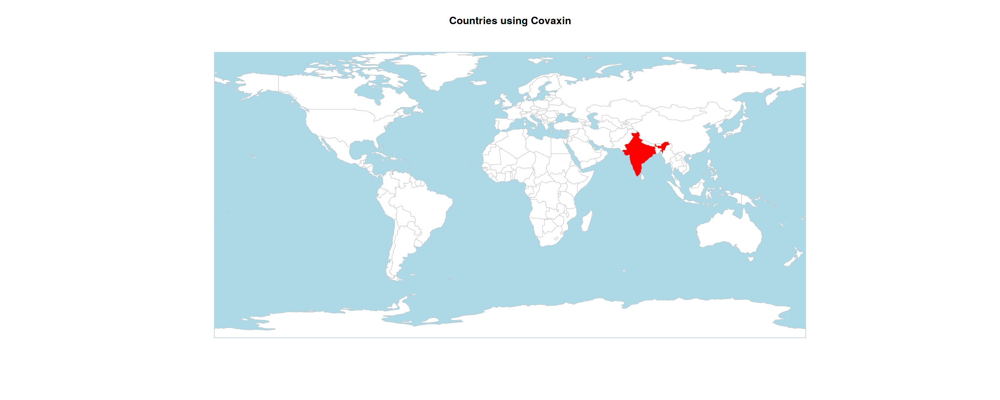

2 codes from your data successfully matched countries in the map
0 codes from your data failed to match with a country code in the map
241 codes from the map weren't represented in your data


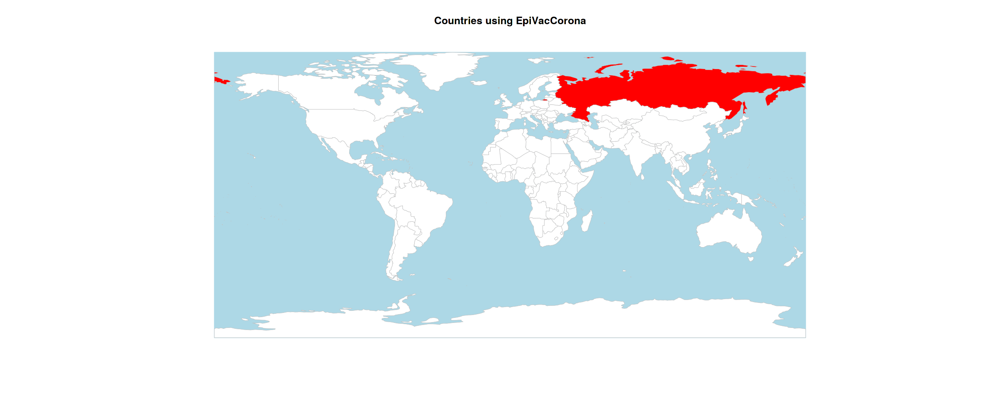

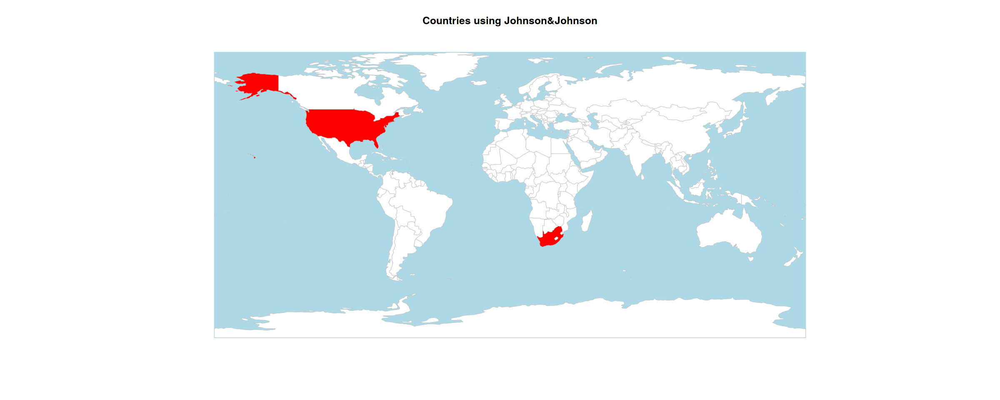

In [165]:
options(repr.plot.width=20, repr.plot.height=8)

plot_world_map <- function(iso,vacc) {
  d <- joinCountryData2Map(iso, joinCode = "ISO3",
      nameJoinColumn = "iso_code", verbose= FALSE)
  mapCountryData(d, nameColumnToPlot="vaccines", catMethod = "categorical",
    missingCountryCol = "white", addLegend = FALSE, mapTitle = paste("Countries using", vacc), oceanCol="lightblue")
    identifyCountries(d, nameCountryColumn = "iso_code",plotSelected = TRUE)
}

for (vac in vaccine_used){
    plot_world_map(world_data[world_data$vaccines == vac,],vac)
}


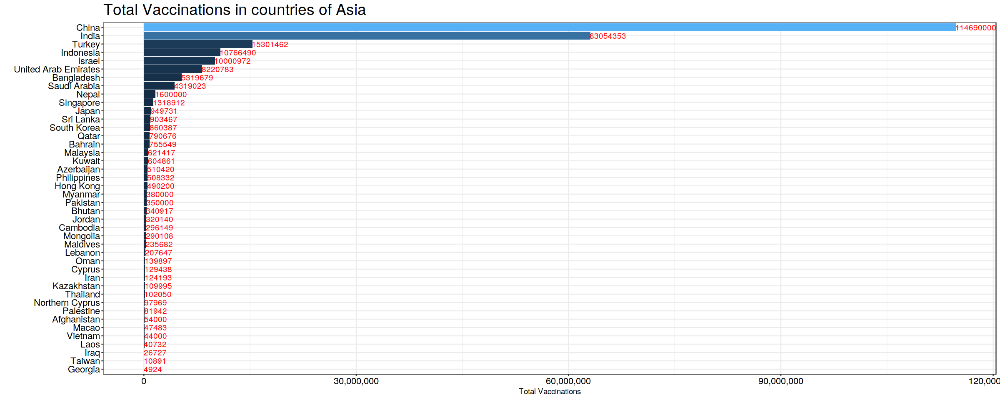

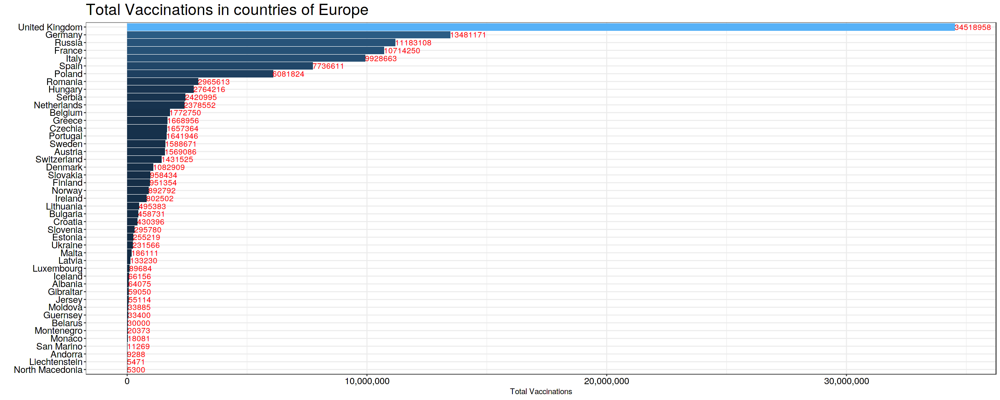

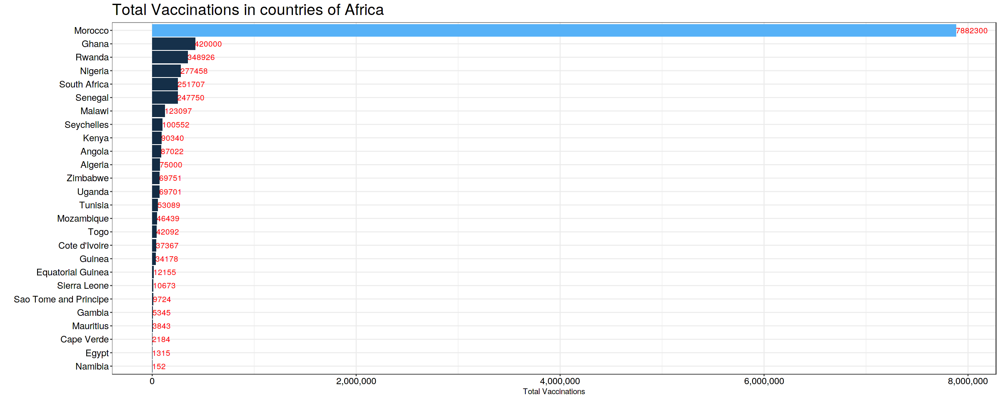

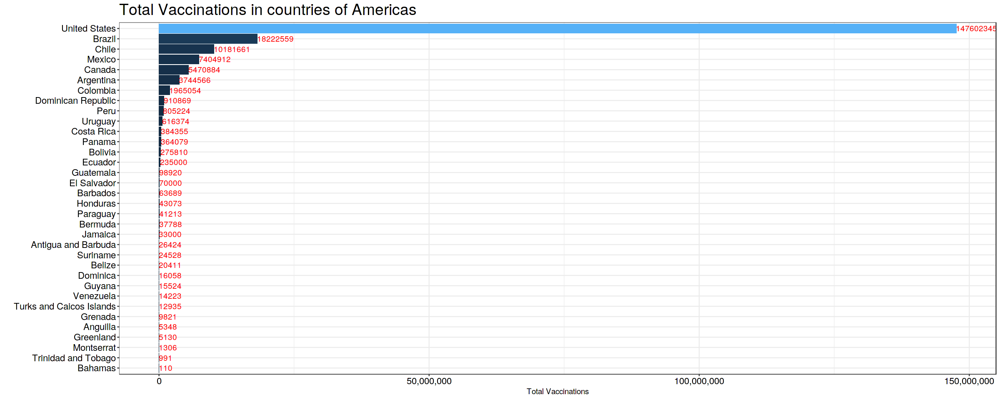

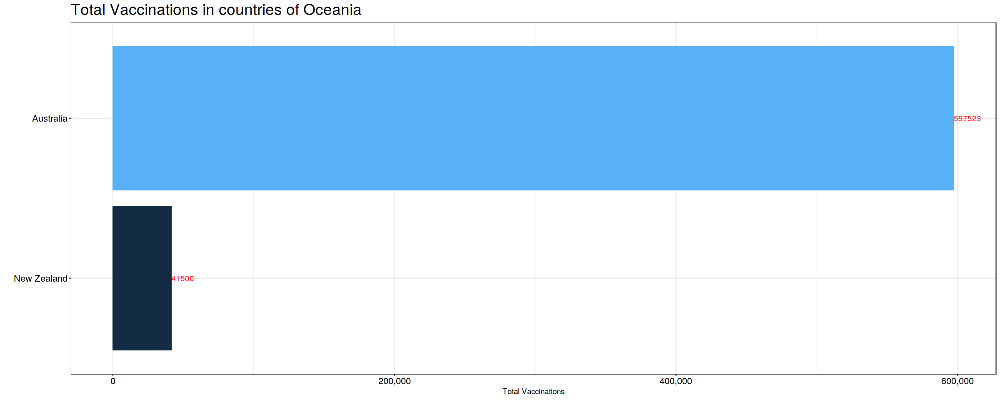

In [166]:
# Total vaccination in the countries
vaccine_data_copy <- vaccine_data_copy %>%
mutate("continent" = countrycode(sourcevar = vaccine_data_copy[, "country"],
                         origin = "country.name",destination = "continent"))


continent_list <- unique(vaccine_data_copy$continent)
par(mfrow=c(2,2))

for (cont in continent_list){
    cont_data<- vaccine_data_copy %>%
    select ("country","total_vaccinations","continent")%>%
    filter(continent == cont)%>%
    group_by(country)%>%
    filter (total_vaccinations == max(total_vaccinations))
    
    print(ggplot(cont_data, mapping=aes(x=reorder(country,+total_vaccinations), y=total_vaccinations, fill=total_vaccinations))+
    geom_col() +
    coord_flip()+
    geom_text(aes(label = total_vaccinations), vjust=0.5,hjust=0.01,color="Red")+
    scale_y_continuous(labels = scales::comma)+
    labs(x="",y = "Total Vaccinations", title  = paste ("Total Vaccinations in countries of", cont))+
    theme_bw()+
    theme(legend.position = "none",axis.text=element_text(color="black",size=13),plot.title = element_text(size=22)))
}

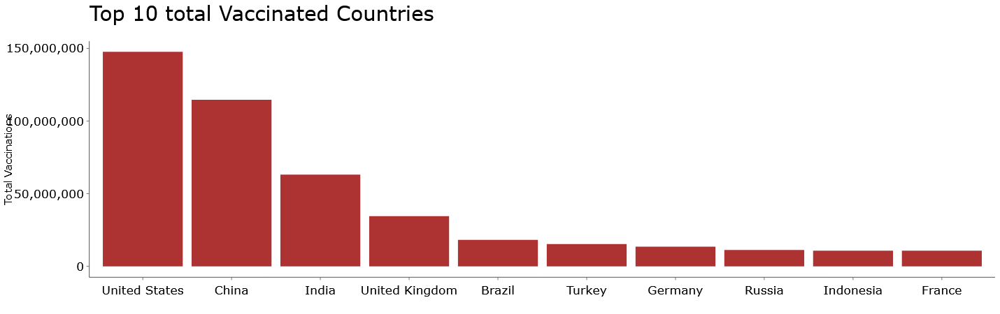

In [167]:
s<- vaccine_data_copy %>%
    select ("country","total_vaccinations","continent")%>%
    group_by(country)%>%
    filter (total_vaccinations == max(total_vaccinations)) %>%
    arrange(desc(total_vaccinations)) %>%
    ungroup() %>%
    slice_max(total_vaccinations,n=10)


options(repr.plot.width=6, repr.plot.height=6)

top_cot_plot<- ggplot (s, mapping=aes(x=reorder(country,-total_vaccinations),y=total_vaccinations))+
geom_col(fill="#990000", alpha=0.8)+
scale_y_continuous(labels = scales::comma)+
theme_classic()+
theme(axis.text=element_text(color="black",size=13),plot.title = element_text(size=22))+
labs(x="",y = "Total Vaccinations", title  = "Top 10 total Vaccinated Countries")

ggplotly(top_cot_plot, tooltip = c("y"))

In [168]:
dose2<- vaccine_data_copy %>%
    select ("country","people_fully_vaccinated")%>%
    group_by(country)%>%
    filter (people_fully_vaccinated == max(people_fully_vaccinated))%>%
    filter (people_fully_vaccinated != 0)%>%
    ungroup() %>%
    distinct() %>%
    slice_max(people_fully_vaccinated,n=10)

dose1<- vaccine_data_copy %>%
    select ("country","people_vaccinated")%>%
    group_by(country)%>%
    filter (people_vaccinated == max(people_vaccinated))%>%
    filter (people_vaccinated != 0)%>%
    ungroup() %>%
    distinct() %>%
    slice_max(people_vaccinated,n=10)%>%
    arrange(desc(country))



final_country<- unique(rbind(dose2[,"country"], dose1[,"country"]))


    

dossage_data<- vaccine_data_copy %>%
filter (country %in% pull(final_country, country)) %>%
select ("country","people_vaccinated","people_fully_vaccinated","total_vaccinations") %>%
group_by(country)%>%
filter (total_vaccinations == max(total_vaccinations)) %>%
arrange(desc(total_vaccinations))

dossage_data2<- melt(dossage_data[,c("country","people_vaccinated","people_fully_vaccinated")], id.vars='country')

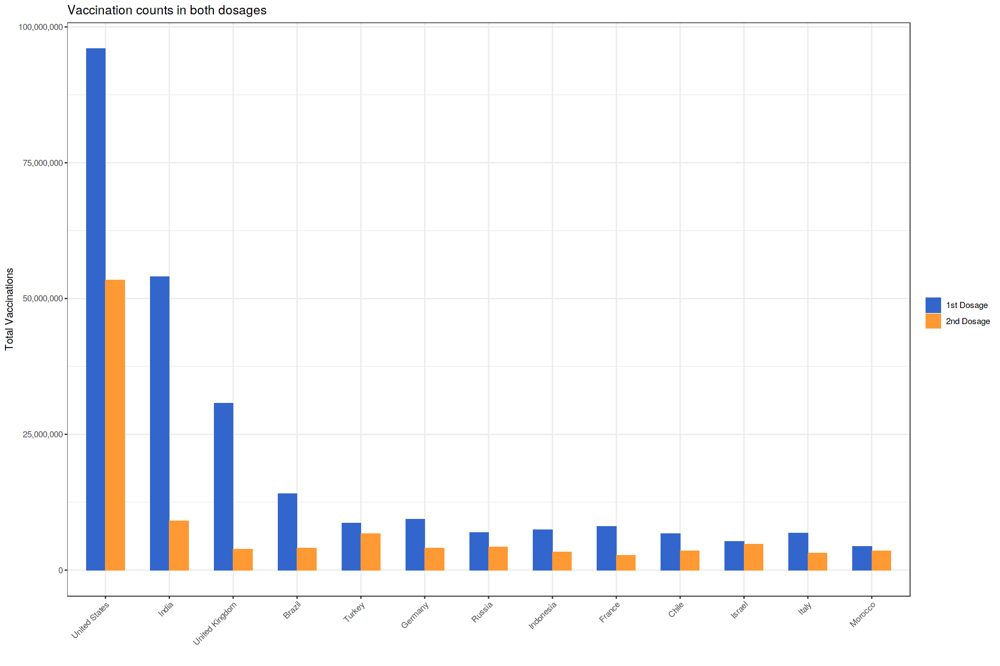

In [169]:
options(repr.plot.width=15, repr.plot.height=10)
ggplot(dossage_data2, aes(x=reorder(country,-value), y=value, fill=variable)) +
geom_bar(stat='identity', position='dodge', width=0.6)+
scale_y_continuous(labels = scales::comma)+
labs(x="",y = "Total Vaccinations", title  = "Vaccination counts in both dosages",fill = element_blank())+
theme_bw()+
theme(axis.text.x = element_text(angle = 45, hjust = 1))+
scale_fill_manual(values=c("#3366CC", "#FF9933"), labels=c("1st Dosage", "2nd Dosage"))


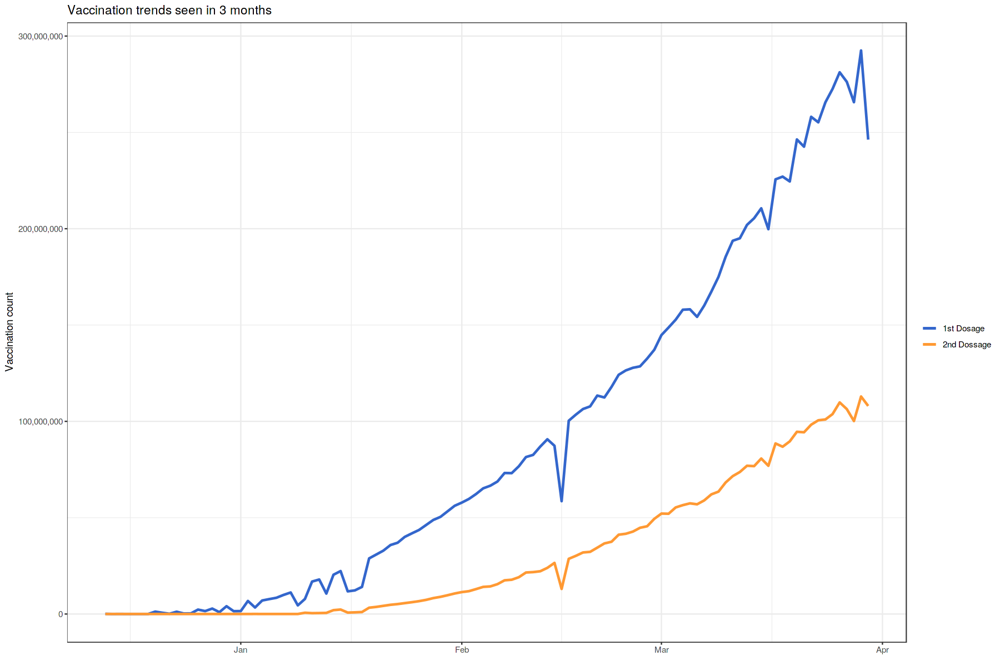

In [170]:
    vaccine_data_copy$date = as.Date(vaccine_data_copy$date)

    vaccine_data_copy %>%
    select ("date","people_vaccinated","people_fully_vaccinated")%>%
    group_by(date) %>%
    summarise (people_vaccinated=sum(people_vaccinated), people_fully_vaccinated=sum(people_fully_vaccinated)) %>%
    ggplot()+
    geom_line(aes(x=date, y=people_vaccinated, col="1st Dosage"), size = 1)+
    geom_line(aes(x=date, y=people_fully_vaccinated, col="2nd Dossage"), size=1)+
    scale_y_continuous(labels = scales::comma)+
    labs(x=element_blank(),y ="Vaccination count", title  = "Vaccination trends seen in 3 months", col=element_blank())+
    theme_bw()+
    scale_color_manual(values = c('1st Dosage' = '#3366CC','2nd Dossage' = '#FF9933'))



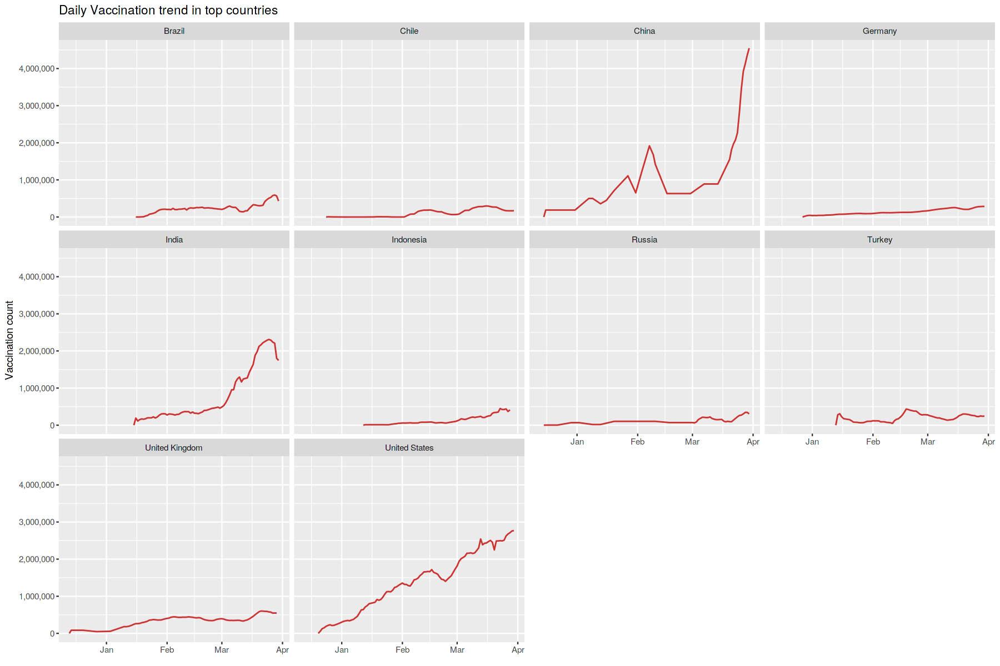

In [201]:
options(warn=-1)
top_vacc_countries<- vaccine_data_copy%>%
select (country, daily_vaccinations)%>%
group_by(country)%>%
filter (daily_vaccinations == max(daily_vaccinations)) %>%
distinct () %>%
ungroup()%>%
slice_max(daily_vaccinations,n=10)%>%
select(country)


vaccine_data_copy %>%
filter (country %in% pull(top_vacc_countries, country))%>%
select (country, date, daily_vaccinations) %>%
ggplot(mapping=aes(x=date,y=daily_vaccinations))+
geom_line(size=0.6, col="#CC3333")+
scale_y_continuous(labels = scales::comma)+
facet_wrap(~country)+
theme_gray()+
labs(x=element_blank(),y ="Vaccination count", title  = "Daily Vaccination trend in top countries", col=element_blank())

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



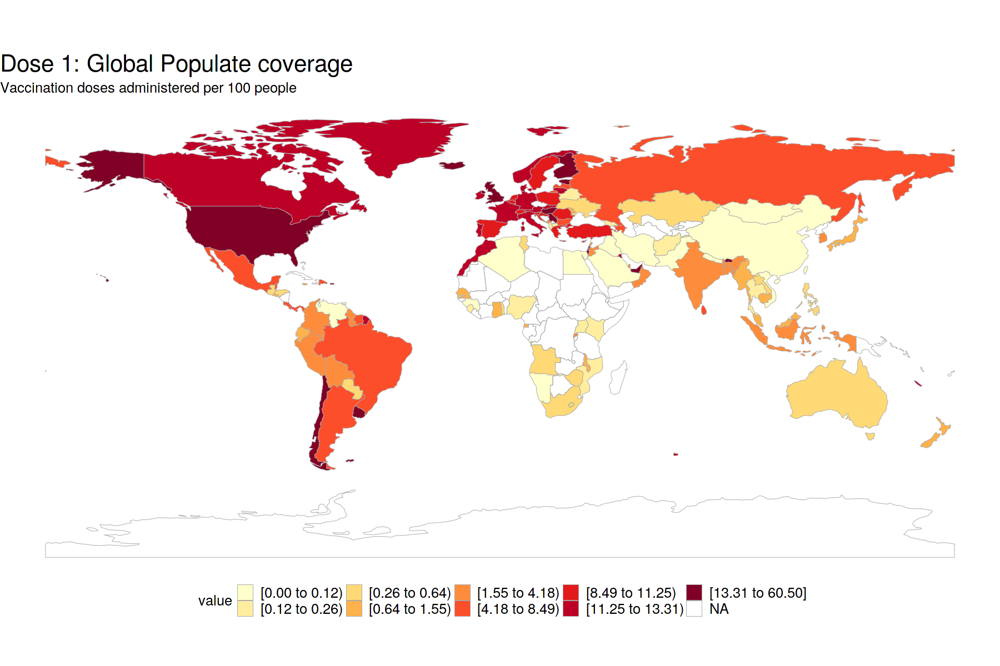

[1] -1

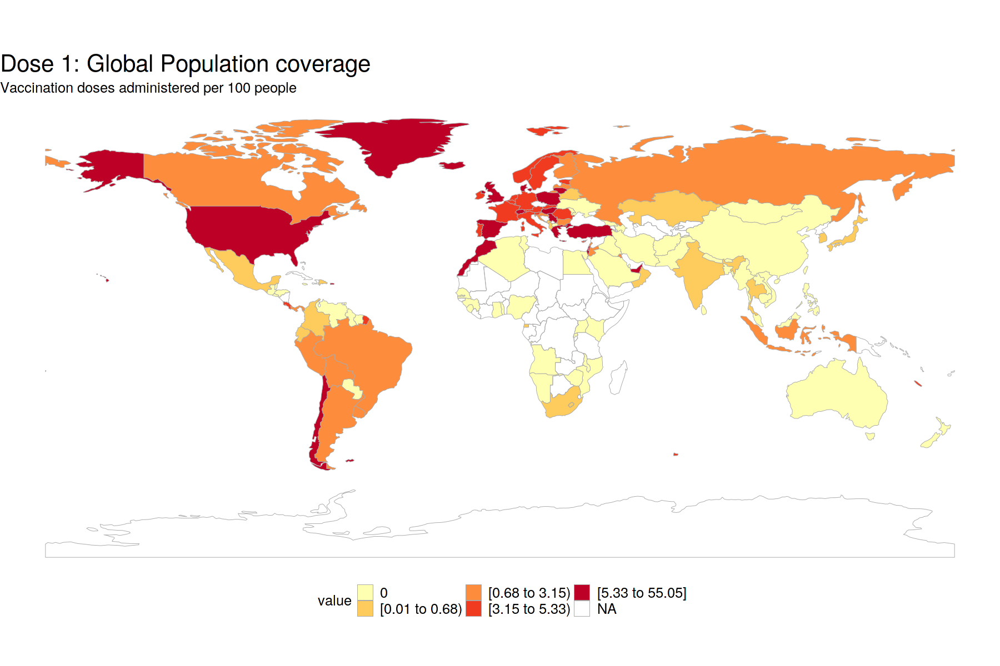

In [200]:
pop_vacc_dose1<-vaccine_data_copy%>%
select ("country","people_vaccinated_per_hundred")%>%
group_by (country)%>%
filter (people_vaccinated_per_hundred == max(people_vaccinated_per_hundred))%>%
arrange(desc(people_vaccinated_per_hundred))%>%
distinct()%>%
ungroup %>%
rename(region = country, value=people_vaccinated_per_hundred) %>%
mutate(region = tolower(region))%>%
mutate(region = recode(region, "united states"    = "united states of america",
                                "north macedonia"  = "macedonia",
                                "serbia" = "republic of serbia"))



pop_vacc_dose2<-vaccine_data_copy%>%
select ("country","people_fully_vaccinated_per_hundred")%>%
group_by (country)%>%
filter (people_fully_vaccinated_per_hundred == max(people_fully_vaccinated_per_hundred))%>%
arrange(desc(people_fully_vaccinated_per_hundred))%>%
distinct()%>%
ungroup %>%
rename(region = country, value=people_fully_vaccinated_per_hundred) %>%
mutate(region = tolower(region))%>%
mutate(region = recode(region, "united states"    = "united states of america",
                                "north macedonia"  = "macedonia",
                                "serbia" = "republic of serbia"))

options(warn=-1)
data(country.map, package = "choroplethrMaps")
con_df<-data.frame("region"=unique(country.map$region))


country_choropleth(pop_vacc_dose1,num_colors=9)+
labs(title = "Dose 1: Global Populate coverage", subtitle = "Vaccination doses administered per 100 people")+
theme(legend.position = "bottom", legend.title = element_text(size = 15), legend.text=element_text(size=15),plot.title = element_text(size=25), plot.subtitle = element_text(size=15))+
scale_fill_brewer(palette="YlOrRd")

country_choropleth(pop_vacc_dose2,num_colors=7)+
labs(title = "Dose 1: Global Population coverage", subtitle = "Vaccination doses administered per 100 people")+
theme(legend.position = "bottom", legend.title = element_text(size = 15), legend.text=element_text(size=15), plot.title = element_text(size=25), plot.subtitle = element_text(size=15))+
scale_fill_brewer(palette="YlOrRd")


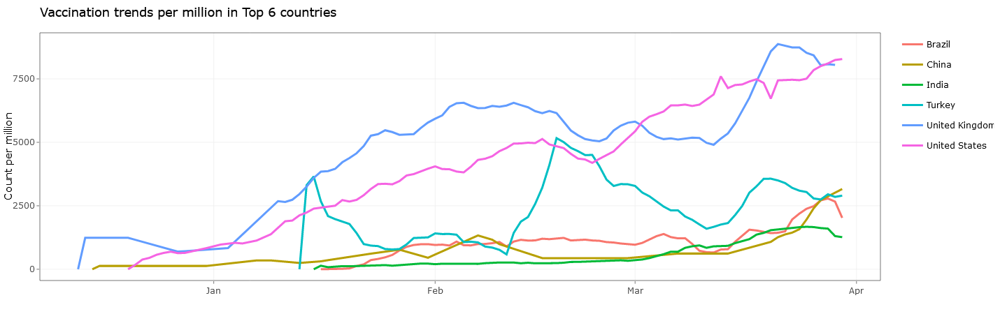

In [173]:
vacc_total<- vaccine_data_copy %>%
select ("country","total_vaccinations")%>%
group_by (country) %>%
filter (total_vaccinations == max(total_vaccinations))%>%
distinct()%>%
ungroup()%>%
slice_max(total_vaccinations,n=6)


ggplotly(vaccine_data_copy %>%
select ("date","country","daily_vaccinations_per_million")%>%
filter (country %in% pull (vacc_total, country))%>%
group_by(country)%>%
ggplot (mapping =aes(x=date, y=daily_vaccinations_per_million))+
geom_line(aes(color=country), size =0.8)+
ylab("Count per million")+
ggtitle("Vaccination trends per million in Top 6 countries")+
theme_bw()+
theme(legend.position="top", legend.title = element_blank(), axis.title.x = element_blank()), tooltip = c("x","y"))